In [1]:
import numpy as np
import os
import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense
from tensorflow.keras.preprocessing import image
from keras.wrappers.scikit_learn import KerasClassifier

from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score

2023-04-08 19:57:26.985714: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# Define classes
classes = ['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I','K', 'L', 'M', 
           'N', 'O', 'P', 'Q', 'S', 'T','U', 'V', 'W', 'X', 'Z']

# Load directories
train_dir = "/Users/daffaizzalhaqqi/Desktop/Seminar Proposal Skripsi Daffa/Skripsi/Data Collection/Training"
test_dir = "/Users/daffaizzalhaqqi/Desktop/Seminar Proposal Skripsi Daffa/Skripsi/Data Collection/Testing"

# Define the image data generators
train_datagen = ImageDataGenerator(rescale=1./255,
                                   validation_split=0.125,
                                   rotation_range=20,
                                   shear_range=0.2,
                                   zoom_range=0.2,
                                   horizontal_flip=True)

test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(64, 64),
    color_mode="grayscale",
    classes=classes,
    class_mode='categorical',
    subset='training',
)

val_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(64, 64),
    color_mode="grayscale",
    classes=classes,
    class_mode='categorical',
    subset='validation',
)


test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(64, 64),
    color_mode="grayscale",
    classes=classes,
    class_mode="categorical",
)


Found 16107 images belonging to 23 classes.
Found 2300 images belonging to 23 classes.
Found 4570 images belonging to 23 classes.


(64, 64, 1)


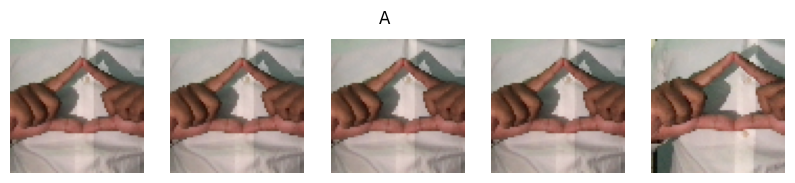

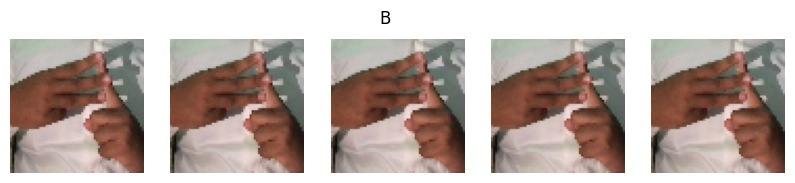

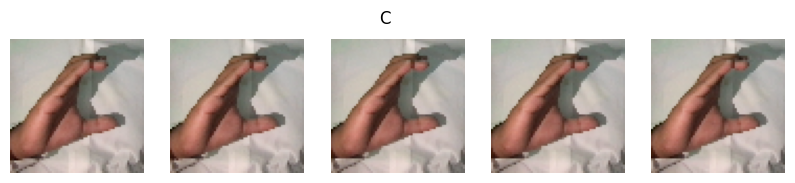

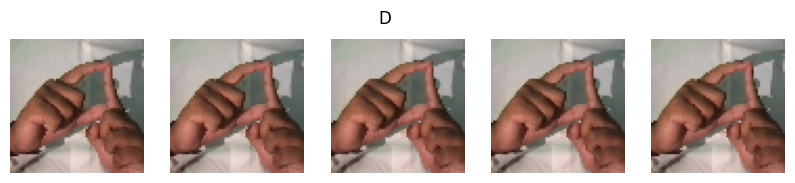

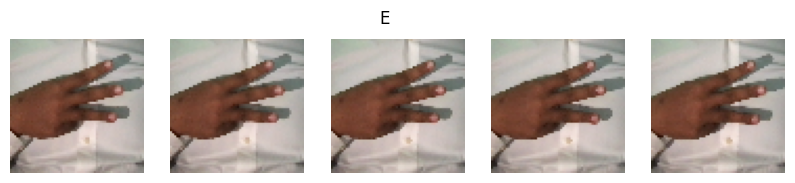

...

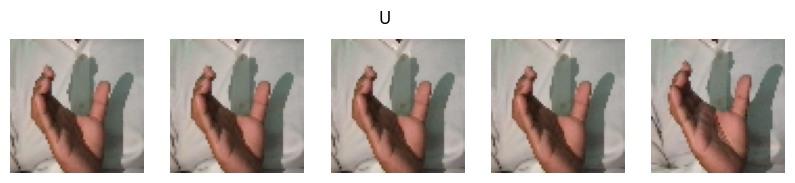

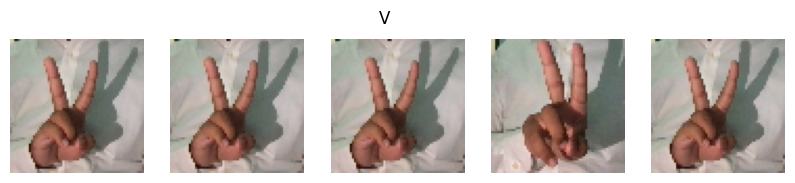

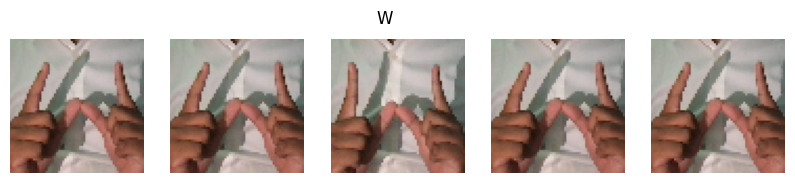

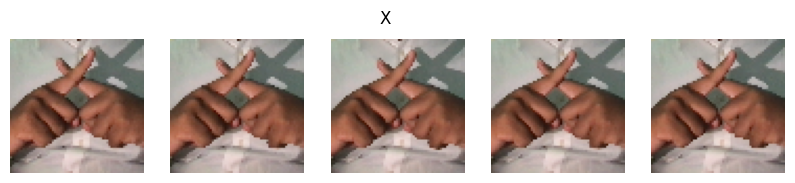

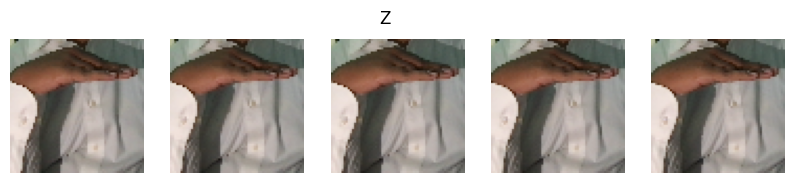

In [3]:
train_dir = train_generator.directory
train_filenames = train_generator.filenames
train_classes = train_generator.classes

# Get the unique class labels
class_labels = list(train_generator.class_indices.keys())

# Print input shape of train_generator
print(train_generator.image_shape)

# Plot the first five images of each class
for label in class_labels:
    # Get the first five images of the current class
    class_images = [filename for filename, class_label in zip(train_filenames, train_classes) if class_label == train_generator.class_indices[label]][:5]
    
    # Plot the images
    plt.figure(figsize=(10,2))
    for i, image_name in enumerate(class_images):
        # Load the image using Keras' image module
        img = image.load_img(os.path.join(train_dir, image_name), target_size=(64, 64))
        
        # Convert the image to a numpy array
        img_array = image.img_to_array(img)
        
        # Plot the image
        plt.subplot(1, 5, i+1)
        plt.imshow(img_array.astype('uint8'))
        plt.axis('off')
        
    plt.suptitle(label)
    plt.show()

(64, 64, 1)


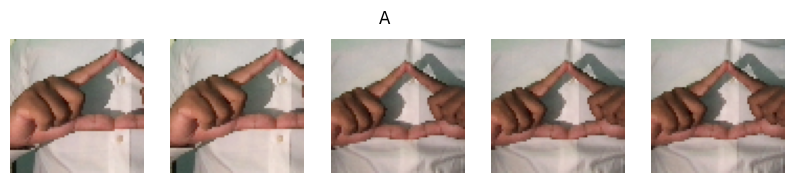

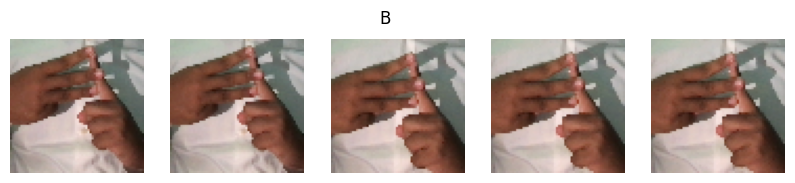

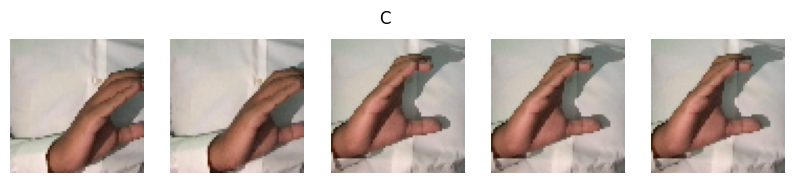

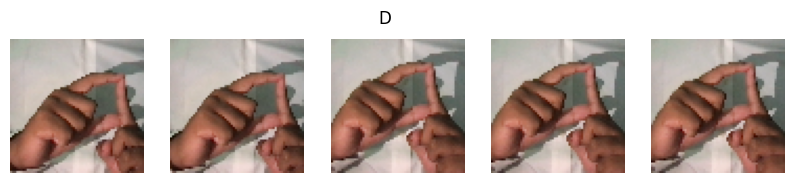

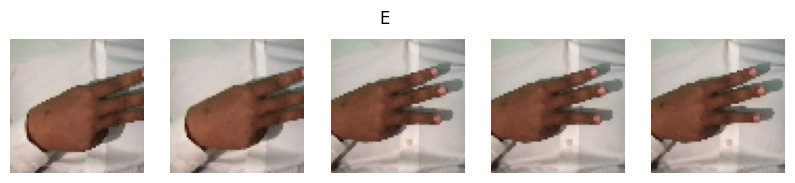

...

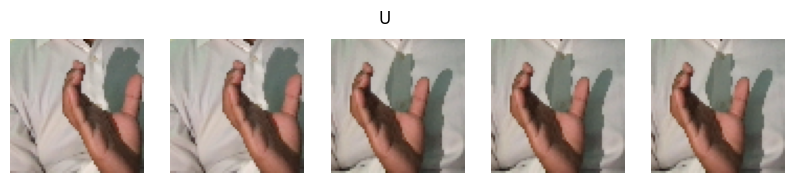

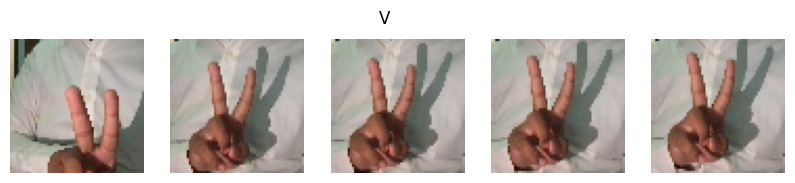

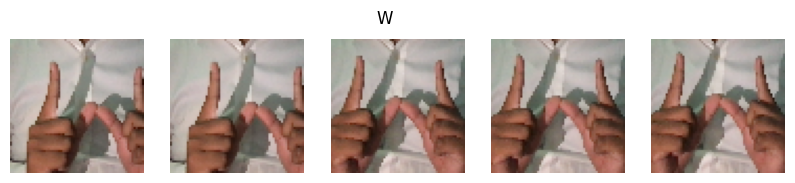

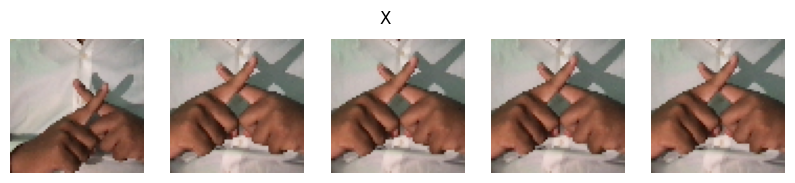

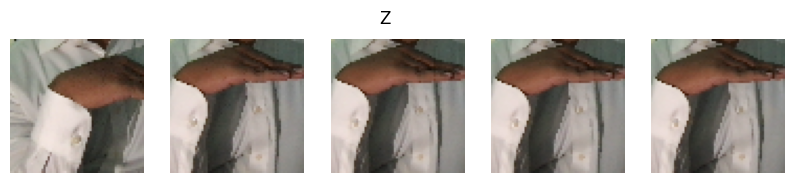

In [4]:
val_dir = val_generator.directory
val_filenames = val_generator.filenames
val_classes = val_generator.classes

# Get the unique class labels
class_labels = list(val_generator.class_indices.keys())

# Print input shape of val_generator
print(val_generator.image_shape)

# Plot the first five images of each class
for label in class_labels:
    # Get the first five images of the current class
    class_images = [filename for filename, class_label in zip(val_filenames, val_classes) if class_label == val_generator.class_indices[label]][:5]
    
    # Plot the images
    plt.figure(figsize=(10,2))
    for i, image_name in enumerate(class_images):
        # Load the image using Keras' image module
        img = image.load_img(os.path.join(train_dir, image_name), target_size=(64, 64))
        
        # Convert the image to a numpy array
        img_array = image.img_to_array(img)
        
        # Plot the image
        plt.subplot(1, 5, i+1)
        plt.imshow(img_array.astype('uint8'))
        plt.axis('off')
        
    plt.suptitle(label)
    plt.show()

(64, 64, 1)


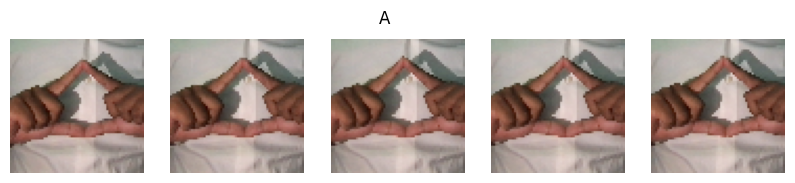

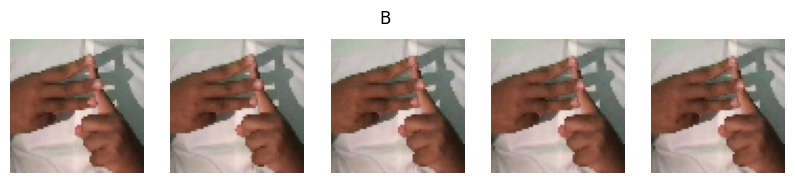

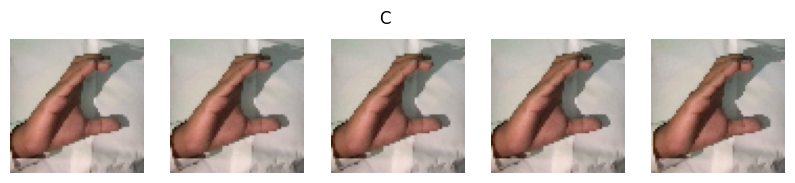

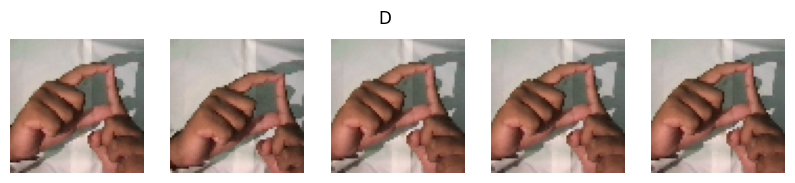

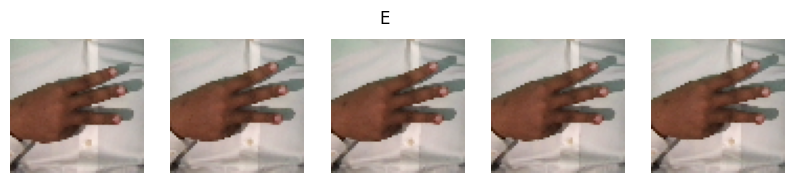

...

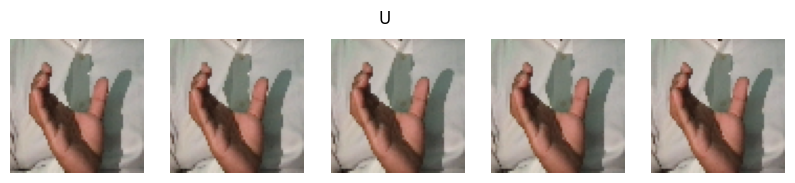

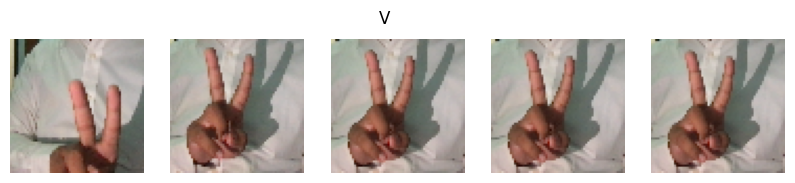

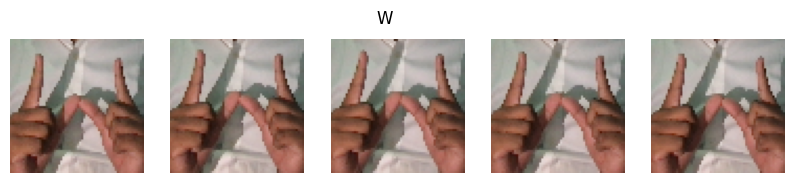

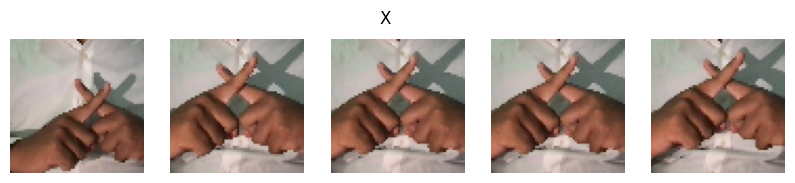

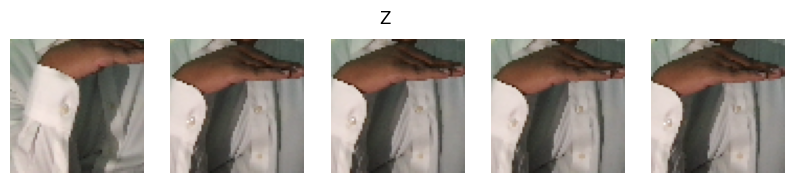

In [5]:
test_dir = test_generator.directory
test_filenames = test_generator.filenames
test_classes = test_generator.classes

# Get the unique class labels
class_labels = list(test_generator.class_indices.keys())

# Print input shape of test_generator
print(test_generator.image_shape)

# Plot the first five images of each class
for label in class_labels:
    # Get the first five images of the current class
    class_images = [filename for filename, class_label in zip(test_filenames, test_classes) if class_label == test_generator.class_indices[label]][:5]
    
    # Plot the images
    plt.figure(figsize=(10,2))
    for i, image_name in enumerate(class_images):
        # Load the image using Keras' image module
        img = image.load_img(os.path.join(test_dir, image_name), target_size=(64, 64))
        
        # Convert the image to a numpy array
        img_array = image.img_to_array(img)
        
        # Plot the image
        plt.subplot(1, 5, i+1)
        plt.imshow(img_array.astype('uint8'))
        plt.axis('off')
        
    plt.suptitle(label)
    plt.show()

In [6]:
# Create an empty list to store the batches of data
X_train = []
y_train = []

# Iterate over the train generator and collect the batches of data
for i in range(len(train_generator)):
    # Get a batch of data from the train generator
    batch = next(train_generator)

    # Extract the input data (X_batch) and labels (y_batch) from the batch
    X_batch = batch[0]
    y_batch = batch[1]

    # Append the batch of input data and labels to the respective lists
    X_train.append(X_batch)
    y_train.append(y_batch)

# Convert the lists to numpy arrays
X_train = np.concatenate(X_train, axis=0)
y_train = np.concatenate(y_train, axis=0)

print((X_train.shape, y_train.shape))

((16107, 64, 64, 1), (16107, 23))


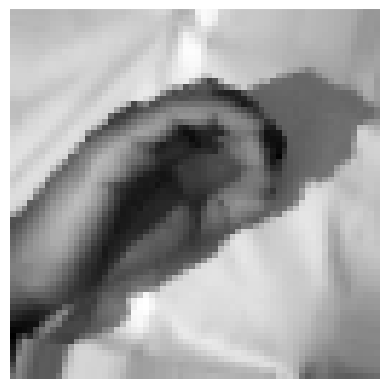

In [7]:
# Display the image
plt.imshow(X_train[0].squeeze(), cmap='gray')
plt.axis('off')
plt.show()

In [8]:
# Print the class
class_idx = np.argmax(y_train[0])
class_name = classes[class_idx] 
print("Class: ", class_name)

Class:  O


In [9]:
# Create an empty list to store the batches of data
X_val = []
y_val = []

# Iterate over the val generator and collect the batches of data
for i in range(len(val_generator)):
    # Get a batch of data from the val generator
    batch = next(val_generator)

    # Extract the input data (X_batch) and labels (y_batch) from the batch
    X_batch = batch[0]
    y_batch = batch[1]

    # Append the batch of input data and labels to the respective lists
    X_val.append(X_batch)
    y_val.append(y_batch)

# Convert the lists to numpy arrays
X_val = np.concatenate(X_val, axis=0)
y_val = np.concatenate(y_val, axis=0)

print((X_val.shape, y_val.shape))

((2300, 64, 64, 1), (2300, 23))


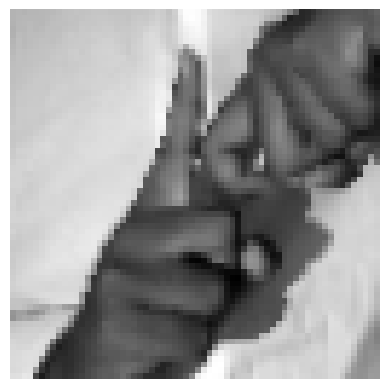

In [10]:
# Display the image
plt.imshow(X_val[0].squeeze(), cmap='gray')
plt.axis('off')
plt.show()

In [11]:
# Print the class
class_idx = np.argmax(y_val[0])
class_name = classes[class_idx] 
print("Class: ", class_name)

Class:  K


In [12]:
# Create an empty list to store the batches of data
X_test = []
y_test = []

# Iterate over the val generator and collect the batches of data
for i in range(len(test_generator)):
    # Get a batch of data from the val generator
    batch = next(test_generator)

    # Extract the input data (X_batch) and labels (y_batch) from the batch
    X_batch = batch[0]
    y_batch = batch[1]

    # Append the batch of input data and labels to the respective lists
    X_test.append(X_batch)
    y_test.append(y_batch)

# Convert the lists to numpy arrays
X_test = np.concatenate(X_test, axis=0)
y_test = np.concatenate(y_test, axis=0)

print((X_test.shape, y_test.shape))

((4570, 64, 64, 1), (4570, 23))


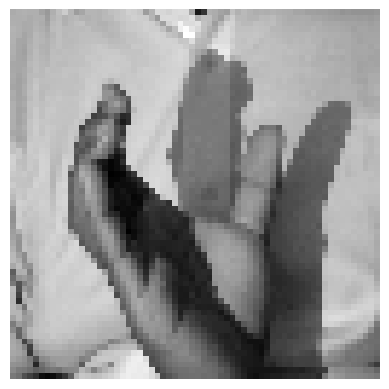

In [13]:
# Display the image
plt.imshow(X_test[0].squeeze(), cmap='gray')
plt.axis('off')
plt.show()

In [15]:
# Print the class
class_idx = np.argmax(y_test[0])
class_name = classes[class_idx] 
print("Class: ", class_name)

Class:  U


In [16]:
# Define the model
def create_model(filters=32, kernel_size=(3, 3), dropout_rate=0.5):
    cnn = Sequential([
        tf.keras.layers.Conv2D(filters=filters, kernel_size=kernel_size, activation='relu', input_shape=(64, 64, 1), strides=(1, 1), padding='same'),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Conv2D(filters=filters*2, kernel_size=kernel_size, activation='relu', strides=(1, 1), padding='same'),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Conv2D(filters=filters*4, kernel_size=kernel_size, activation='relu', strides=(1, 1), padding='same'),
        tf.keras.layers.MaxPooling2D(pool_size=(2, 2)),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(128, activation='relu'),
        tf.keras.layers.Dropout(dropout_rate),
        tf.keras.layers.Dense(len(classes), activation='softmax')
    ])
    cnn.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    return cnn

In [17]:
# Define the grid search parameters
param_dist= {
    'filters': [16, 32],
    'kernel_size': [(3, 3), (5, 5)],
    'dropout_rate': [0.3, 0.5]
}

# Create an instance of the KerasClassifier with your custom create_model function
keras_model = KerasClassifier(build_fn=create_model)

# Create the random search object
random_search = RandomizedSearchCV(estimator=keras_model, param_distributions=param_dist, scoring='accuracy', cv=3, n_iter=4)

# Fit the random search object to the data
random_search.fit(X_train, y_train, epochs=20, validation_data=(X_val, y_val))

/var/folders/vd/wqzmcn_n0zg78c3qrfwlgj440000gn/T/ipykernel_29780/3689533858.py:9: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  keras_model = KerasClassifier(build_fn=create_model)


Epoch 1/20
336/336 [==============================] - 29s 82ms/step - loss: 1.1872 - accuracy: 0.6414 - val_loss: 0.4948 - val_accuracy: 0.8943
Epoch 2/20
336/336 [==============================] - 30s 88ms/step - loss: 0.1876 - accuracy: 0.9491 - val_loss: 0.3331 - val_accuracy: 0.9178
Epoch 3/20
336/336 [==============================] - 34s 102ms/step - loss: 0.1206 - accuracy: 0.9649 - val_loss: 0.2909 - val_accuracy: 0.9239
Epoch 4/20
336/336 [==============================] - 40s 120ms/step - loss: 0.0870 - accuracy: 0.9746 - val_loss: 0.2083 - val_accuracy: 0.9487
Epoch 5/20
336/336 [==============================] - 45s 134ms/step - loss: 0.0646 - accuracy: 0.9790 - val_loss: 0.1850 - val_accuracy: 0.9548
Epoch 6/20
336/336 [==============================] - 44s 129ms/step - loss: 0.0622 - accuracy: 0.9817 - val_loss: 0.1609 - val_accuracy: 0.9604
Epoch 7/20
336/336 [==============================] - 35s 105ms/step - loss: 0.0422 - accuracy: 0.9875 - val_loss: 0.1967 - val_accu

/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3

Epoch 1/20
336/336 [==============================] - 37s 107ms/step - loss: 0.9306 - accuracy: 0.7230 - val_loss: 0.3627 - val_accuracy: 0.9113
Epoch 2/20
336/336 [==============================] - 34s 102ms/step - loss: 0.1574 - accuracy: 0.9593 - val_loss: 0.4264 - val_accuracy: 0.9030
Epoch 3/20
336/336 [==============================] - 36s 107ms/step - loss: 0.0921 - accuracy: 0.9728 - val_loss: 0.1777 - val_accuracy: 0.9543
Epoch 4/20
336/336 [==============================] - 36s 107ms/step - loss: 0.0569 - accuracy: 0.9830 - val_loss: 0.3785 - val_accuracy: 0.9139
Epoch 5/20
336/336 [==============================] - 36s 108ms/step - loss: 0.0406 - accuracy: 0.9886 - val_loss: 0.1832 - val_accuracy: 0.9452
Epoch 6/20
336/336 [==============================] - 40s 119ms/step - loss: 0.0313 - accuracy: 0.9901 - val_loss: 0.1484 - val_accuracy: 0.9691
Epoch 7/20
336/336 [==============================] - 36s 107ms/step - loss: 0.0332 - accuracy: 0.9892 - val_loss: 0.1672 - val_ac

/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3

Epoch 1/20
336/336 [==============================] - 34s 98ms/step - loss: 1.1087 - accuracy: 0.6713 - val_loss: 0.4746 - val_accuracy: 0.9109
Epoch 2/20
336/336 [==============================] - 39s 116ms/step - loss: 0.1721 - accuracy: 0.9552 - val_loss: 0.2976 - val_accuracy: 0.9391
Epoch 3/20
336/336 [==============================] - 40s 120ms/step - loss: 0.0966 - accuracy: 0.9751 - val_loss: 0.2670 - val_accuracy: 0.9396
Epoch 4/20
336/336 [==============================] - 36s 107ms/step - loss: 0.0644 - accuracy: 0.9816 - val_loss: 0.2210 - val_accuracy: 0.9574
Epoch 5/20
336/336 [==============================] - 36s 108ms/step - loss: 0.0507 - accuracy: 0.9859 - val_loss: 0.2341 - val_accuracy: 0.9578
Epoch 6/20
336/336 [==============================] - 38s 112ms/step - loss: 0.0421 - accuracy: 0.9858 - val_loss: 0.2104 - val_accuracy: 0.9543
Epoch 7/20
336/336 [==============================] - 34s 102ms/step - loss: 0.0327 - accuracy: 0.9891 - val_loss: 0.1889 - val_acc

/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3

Epoch 1/20
336/336 [==============================] - 35s 102ms/step - loss: 1.6999 - accuracy: 0.4653 - val_loss: 0.4757 - val_accuracy: 0.8917
Epoch 2/20
336/336 [==============================] - 37s 110ms/step - loss: 0.5772 - accuracy: 0.8085 - val_loss: 0.3964 - val_accuracy: 0.9022
Epoch 3/20
336/336 [==============================] - 41s 121ms/step - loss: 0.4281 - accuracy: 0.8493 - val_loss: 0.3374 - val_accuracy: 0.9191
Epoch 4/20
336/336 [==============================] - 39s 116ms/step - loss: 0.3758 - accuracy: 0.8692 - val_loss: 0.3253 - val_accuracy: 0.9130
Epoch 5/20
336/336 [==============================] - 38s 112ms/step - loss: 0.3085 - accuracy: 0.8906 - val_loss: 0.2747 - val_accuracy: 0.9309
Epoch 6/20
336/336 [==============================] - 41s 123ms/step - loss: 0.2734 - accuracy: 0.9047 - val_loss: 0.2405 - val_accuracy: 0.9443
Epoch 7/20
336/336 [==============================] - 40s 119ms/step - loss: 0.2390 - accuracy: 0.9135 - val_loss: 0.2634 - val_ac

/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3

Epoch 1/20
336/336 [==============================] - 39s 112ms/step - loss: 1.4972 - accuracy: 0.5348 - val_loss: 0.4600 - val_accuracy: 0.8909
Epoch 2/20
336/336 [==============================] - 37s 110ms/step - loss: 0.4081 - accuracy: 0.8737 - val_loss: 0.4241 - val_accuracy: 0.8943
Epoch 3/20
336/336 [==============================] - 37s 110ms/step - loss: 0.2724 - accuracy: 0.9139 - val_loss: 0.2614 - val_accuracy: 0.9226
Epoch 4/20
336/336 [==============================] - 38s 113ms/step - loss: 0.2182 - accuracy: 0.9296 - val_loss: 0.2569 - val_accuracy: 0.9404
Epoch 5/20
336/336 [==============================] - 37s 110ms/step - loss: 0.1858 - accuracy: 0.9367 - val_loss: 0.2339 - val_accuracy: 0.9339
Epoch 6/20
336/336 [==============================] - 36s 107ms/step - loss: 0.1596 - accuracy: 0.9462 - val_loss: 0.1722 - val_accuracy: 0.9474
Epoch 7/20
336/336 [==============================] - 37s 109ms/step - loss: 0.1481 - accuracy: 0.9502 - val_loss: 0.1719 - val_ac

/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3

Epoch 1/20
336/336 [==============================] - 35s 101ms/step - loss: 1.6871 - accuracy: 0.4704 - val_loss: 0.4514 - val_accuracy: 0.8974
Epoch 2/20
336/336 [==============================] - 36s 106ms/step - loss: 0.5046 - accuracy: 0.8271 - val_loss: 0.3379 - val_accuracy: 0.9130
Epoch 3/20
336/336 [==============================] - 36s 107ms/step - loss: 0.3794 - accuracy: 0.8712 - val_loss: 0.2684 - val_accuracy: 0.9304
Epoch 4/20
336/336 [==============================] - 35s 104ms/step - loss: 0.2903 - accuracy: 0.9004 - val_loss: 0.2841 - val_accuracy: 0.9313
Epoch 5/20
336/336 [==============================] - 36s 107ms/step - loss: 0.2459 - accuracy: 0.9121 - val_loss: 0.2226 - val_accuracy: 0.9491
Epoch 6/20
336/336 [==============================] - 38s 113ms/step - loss: 0.2066 - accuracy: 0.9280 - val_loss: 0.2741 - val_accuracy: 0.9270
Epoch 7/20
336/336 [==============================] - 37s 109ms/step - loss: 0.1700 - accuracy: 0.9381 - val_loss: 0.2437 - val_ac

/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3

Epoch 1/20
336/336 [==============================] - 62s 178ms/step - loss: 1.2504 - accuracy: 0.6131 - val_loss: 0.3889 - val_accuracy: 0.8948
Epoch 2/20
336/336 [==============================] - 62s 185ms/step - loss: 0.2439 - accuracy: 0.9303 - val_loss: 0.3281 - val_accuracy: 0.9213
Epoch 3/20
336/336 [==============================] - 63s 187ms/step - loss: 0.1537 - accuracy: 0.9549 - val_loss: 0.2159 - val_accuracy: 0.9478
Epoch 4/20
336/336 [==============================] - 62s 186ms/step - loss: 0.1119 - accuracy: 0.9649 - val_loss: 0.1980 - val_accuracy: 0.9522
Epoch 5/20
336/336 [==============================] - 61s 181ms/step - loss: 0.0914 - accuracy: 0.9710 - val_loss: 0.1467 - val_accuracy: 0.9687
Epoch 6/20
336/336 [==============================] - 62s 183ms/step - loss: 0.0799 - accuracy: 0.9729 - val_loss: 0.2538 - val_accuracy: 0.9422
Epoch 7/20
336/336 [==============================] - 62s 183ms/step - loss: 0.0672 - accuracy: 0.9780 - val_loss: 0.1129 - val_ac

/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3

Epoch 1/20
336/336 [==============================] - 61s 178ms/step - loss: 1.4417 - accuracy: 0.5606 - val_loss: 0.4394 - val_accuracy: 0.8961
Epoch 2/20
336/336 [==============================] - 62s 185ms/step - loss: 0.3112 - accuracy: 0.9037 - val_loss: 0.3105 - val_accuracy: 0.9248
Epoch 3/20
336/336 [==============================] - 60s 178ms/step - loss: 0.2004 - accuracy: 0.9385 - val_loss: 0.2718 - val_accuracy: 0.9383
Epoch 4/20
336/336 [==============================] - 62s 184ms/step - loss: 0.1363 - accuracy: 0.9575 - val_loss: 0.2502 - val_accuracy: 0.9370
Epoch 5/20
336/336 [==============================] - 60s 178ms/step - loss: 0.1214 - accuracy: 0.9587 - val_loss: 0.1792 - val_accuracy: 0.9583
Epoch 6/20
336/336 [==============================] - 62s 184ms/step - loss: 0.1053 - accuracy: 0.9659 - val_loss: 0.1784 - val_accuracy: 0.9565
Epoch 7/20
336/336 [==============================] - 60s 179ms/step - loss: 0.0803 - accuracy: 0.9734 - val_loss: 0.2514 - val_ac

/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3

Epoch 1/20
336/336 [==============================] - 62s 181ms/step - loss: 1.4171 - accuracy: 0.5603 - val_loss: 0.3721 - val_accuracy: 0.9022
Epoch 2/20
336/336 [==============================] - 64s 190ms/step - loss: 0.3249 - accuracy: 0.9018 - val_loss: 0.2982 - val_accuracy: 0.9239
Epoch 3/20
336/336 [==============================] - 65s 194ms/step - loss: 0.2051 - accuracy: 0.9391 - val_loss: 0.2518 - val_accuracy: 0.9378
Epoch 4/20
336/336 [==============================] - 66s 195ms/step - loss: 0.1399 - accuracy: 0.9563 - val_loss: 0.2305 - val_accuracy: 0.9413
Epoch 5/20
336/336 [==============================] - 64s 192ms/step - loss: 0.1096 - accuracy: 0.9646 - val_loss: 0.2769 - val_accuracy: 0.9217
Epoch 6/20
336/336 [==============================] - 68s 201ms/step - loss: 0.0838 - accuracy: 0.9720 - val_loss: 0.1767 - val_accuracy: 0.9526
Epoch 7/20
336/336 [==============================] - 67s 201ms/step - loss: 0.0759 - accuracy: 0.9731 - val_loss: 0.2198 - val_ac

/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3

Epoch 1/20
336/336 [==============================] - 68s 200ms/step - loss: 1.0233 - accuracy: 0.6885 - val_loss: 0.4688 - val_accuracy: 0.8861
Epoch 2/20
336/336 [==============================] - 68s 202ms/step - loss: 0.1776 - accuracy: 0.9510 - val_loss: 0.3311 - val_accuracy: 0.9287
Epoch 3/20
336/336 [==============================] - 67s 200ms/step - loss: 0.1174 - accuracy: 0.9668 - val_loss: 0.2205 - val_accuracy: 0.9461
Epoch 4/20
336/336 [==============================] - 67s 199ms/step - loss: 0.0737 - accuracy: 0.9788 - val_loss: 0.2032 - val_accuracy: 0.9587
Epoch 5/20
336/336 [==============================] - 68s 204ms/step - loss: 0.0583 - accuracy: 0.9830 - val_loss: 0.1967 - val_accuracy: 0.9622
Epoch 6/20
336/336 [==============================] - 67s 198ms/step - loss: 0.0579 - accuracy: 0.9834 - val_loss: 0.1605 - val_accuracy: 0.9622
Epoch 7/20
336/336 [==============================] - 67s 200ms/step - loss: 0.0356 - accuracy: 0.9891 - val_loss: 0.1667 - val_ac

/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3

Epoch 1/20
336/336 [==============================] - 68s 200ms/step - loss: 1.3332 - accuracy: 0.5856 - val_loss: 0.5564 - val_accuracy: 0.8783
Epoch 2/20
336/336 [==============================] - 69s 204ms/step - loss: 0.2277 - accuracy: 0.9370 - val_loss: 0.3389 - val_accuracy: 0.9278
Epoch 3/20
336/336 [==============================] - 69s 206ms/step - loss: 0.1323 - accuracy: 0.9613 - val_loss: 0.2604 - val_accuracy: 0.9417
Epoch 4/20
336/336 [==============================] - 67s 199ms/step - loss: 0.1000 - accuracy: 0.9705 - val_loss: 0.2850 - val_accuracy: 0.9265
Epoch 5/20
336/336 [==============================] - 71s 210ms/step - loss: 0.0859 - accuracy: 0.9742 - val_loss: 0.1686 - val_accuracy: 0.9604
Epoch 6/20
336/336 [==============================] - 68s 202ms/step - loss: 0.0605 - accuracy: 0.9804 - val_loss: 0.1696 - val_accuracy: 0.9587
Epoch 7/20
336/336 [==============================] - 69s 206ms/step - loss: 0.0497 - accuracy: 0.9832 - val_loss: 0.2245 - val_ac

/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3

Epoch 1/20
336/336 [==============================] - 68s 199ms/step - loss: 1.2796 - accuracy: 0.6073 - val_loss: 0.5430 - val_accuracy: 0.9009
Epoch 2/20
336/336 [==============================] - 69s 205ms/step - loss: 0.2387 - accuracy: 0.9312 - val_loss: 0.3123 - val_accuracy: 0.9404
Epoch 3/20
336/336 [==============================] - 67s 200ms/step - loss: 0.1462 - accuracy: 0.9578 - val_loss: 0.2609 - val_accuracy: 0.9483
Epoch 4/20
336/336 [==============================] - 68s 202ms/step - loss: 0.1107 - accuracy: 0.9668 - val_loss: 0.1931 - val_accuracy: 0.9600
Epoch 5/20
336/336 [==============================] - 68s 203ms/step - loss: 0.0803 - accuracy: 0.9739 - val_loss: 0.2002 - val_accuracy: 0.9513
Epoch 6/20
336/336 [==============================] - 67s 200ms/step - loss: 0.0668 - accuracy: 0.9773 - val_loss: 0.2176 - val_accuracy: 0.9609
Epoch 7/20
336/336 [==============================] - 68s 202ms/step - loss: 0.0690 - accuracy: 0.9780 - val_loss: 0.1968 - val_ac

/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py:778: UserWarning: Scoring failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/model_selection/_validation.py", line 767, in _score
    scores = scorer(estimator, X_test, y_test)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 234, in __call__
    return self._score(
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/metrics/_scorer.py", line 282, in _score
    return self._sign * self._score_func(y_true, y_pred, **self._kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3.10/site-packages/sklearn/utils/_param_validation.py", line 192, in wrapper
    return func(*args, **kwargs)
  File "/opt/anaconda3/envs/newenvironment/lib/python3

Epoch 1/20
504/504 [==============================] - 69s 134ms/step - loss: 0.7190 - accuracy: 0.7844 - val_loss: 0.3185 - val_accuracy: 0.9061
Epoch 2/20
504/504 [==============================] - 68s 136ms/step - loss: 0.0995 - accuracy: 0.9742 - val_loss: 0.1789 - val_accuracy: 0.9526
Epoch 3/20
504/504 [==============================] - 74s 147ms/step - loss: 0.0589 - accuracy: 0.9829 - val_loss: 0.1462 - val_accuracy: 0.9587
Epoch 4/20
504/504 [==============================] - 70s 140ms/step - loss: 0.0423 - accuracy: 0.9870 - val_loss: 0.1491 - val_accuracy: 0.9652
Epoch 5/20
504/504 [==============================] - 68s 135ms/step - loss: 0.0323 - accuracy: 0.9899 - val_loss: 0.1118 - val_accuracy: 0.9713
Epoch 6/20
504/504 [==============================] - 77s 152ms/step - loss: 0.0231 - accuracy: 0.9930 - val_loss: 0.1043 - val_accuracy: 0.9713
Epoch 7/20
504/504 [==============================] - 72s 142ms/step - loss: 0.0248 - accuracy: 0.9925 - val_loss: 0.1069 - val_ac

RandomizedSearchCV(cv=3,
                   estimator=<keras.wrappers.scikit_learn.KerasClassifier object at 0x7f9eefab4d90>,
                   n_iter=4,
                   param_distributions={'dropout_rate': [0.3, 0.5],
                                        'filters': [16, 32],
                                        'kernel_size': [(3, 3), (5, 5)]},
                   scoring='accuracy')

In [18]:
# Get the best model and its hyperparameters
best_cnn_model = random_search.best_estimator_
best_cnn_params = random_search.best_params_
print(f"Best hyperparameters: {best_cnn_params}")

Best hyperparameters: {'kernel_size': (5, 5), 'filters': 16, 'dropout_rate': 0.3}


Epoch 1/20
504/504 [==============================] - 61s 120ms/step - loss: 0.7488 - accuracy: 0.7781 - val_loss: 0.3326 - val_accuracy: 0.9270
Epoch 2/20
504/504 [==============================] - 68s 134ms/step - loss: 0.1337 - accuracy: 0.9642 - val_loss: 0.2778 - val_accuracy: 0.9343
Epoch 3/20
504/504 [==============================] - 62s 123ms/step - loss: 0.0780 - accuracy: 0.9764 - val_loss: 0.3837 - val_accuracy: 0.9109
Epoch 4/20
504/504 [==============================] - 61s 121ms/step - loss: 0.0559 - accuracy: 0.9830 - val_loss: 0.1694 - val_accuracy: 0.9617
Epoch 5/20
504/504 [==============================] - 64s 128ms/step - loss: 0.0469 - accuracy: 0.9858 - val_loss: 0.1636 - val_accuracy: 0.9609
Epoch 6/20
504/504 [==============================] - 60s 119ms/step - loss: 0.0295 - accuracy: 0.9910 - val_loss: 0.1538 - val_accuracy: 0.9670
Epoch 7/20
504/504 [==============================] - 61s 121ms/step - loss: 0.0306 - accuracy: 0.9898 - val_loss: 0.1535 - val_ac

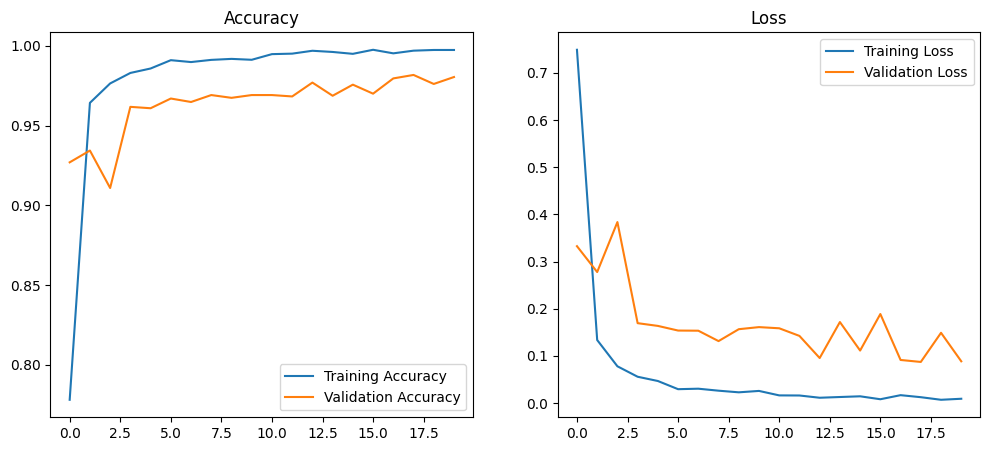

In [19]:
# Plot the training and validation accuracy and loss
history = best_cnn_model.fit(X_train, y_train, epochs=20, validation_data=(X_val, y_val))
    
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].set_title("Accuracy")
ax[0].plot(history.history['accuracy'], label='Training Accuracy')
ax[0].plot(history.history['val_accuracy'], label='Validation Accuracy')
ax[0].legend()
ax[1].set_title("Loss")
ax[1].plot(history.history['loss'], label='Training Loss')
ax[1].plot(history.history['val_loss'], label='Validation Loss')
ax[1].legend()
fig.canvas.draw()

plt.show()

In [20]:
# Print model summary
cnn_final = best_cnn_model.model
cnn_final.summary()

Model: "sequential_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_39 (Conv2D)          (None, 64, 64, 16)        416       
                                                                 
 max_pooling2d_39 (MaxPoolin  (None, 32, 32, 16)       0         
 g2D)                                                            
                                                                 
 conv2d_40 (Conv2D)          (None, 32, 32, 32)        12832     
                                                                 
 max_pooling2d_40 (MaxPoolin  (None, 16, 16, 32)       0         
 g2D)                                                            
                                                                 
 conv2d_41 (Conv2D)          (None, 16, 16, 64)        51264     
                                                                 
 max_pooling2d_41 (MaxPoolin  (None, 8, 8, 64)       

In [21]:
# Evaluate the model on the test set and generate predictions
test_loss, test_acc = cnn_final.evaluate(X_test, y_test, verbose=0)
print(f'Test loss: {test_loss:.3f}, Test accuracy: {test_acc:.3f}')

Test loss: 0.004, Test accuracy: 0.999


In [41]:
# Generate predictions on the test set and display classification report
y_true = np.argmax(y_test, axis=1)  # Update to get the true classes from y_test

# Convert predictions to classes
y_pred = cnn_final.predict(X_test)
y_pred_classes = np.argmax(y_pred, axis=1)

# Define a dictionary that maps class indices to class names
class_names = {0: "A", 1: "B", 2: "C", 3: "D", 4: "E",
              5: "F", 6: "G", 7: "H", 8: "I", 9: "K",
              10: "L", 11: "M", 12: "N", 13: "O", 14: "P",
              15: "Q", 16: "S", 17: "T", 18: "U", 19: "V",
              20: "W", 21: "X", 22: "Z"}

# Convert class indices to class names
y_true_class_names = [class_names[class_idx] for class_idx in y_true]
y_pred_class_names = [class_names[class_idx] for class_idx in y_pred_classes]

# Display classification report with class names
print("Classification Report:")
print(classification_report(y_true_class_names, y_pred_class_names))

143/143 [==============================] - 2s 14ms/step
Classification Report:
              precision    recall  f1-score   support

           A       1.00      1.00      1.00       199
           B       1.00      1.00      1.00       198
           C       1.00      0.99      1.00       199
           D       1.00      1.00      1.00       199
           E       1.00      1.00      1.00       199
           F       1.00      1.00      1.00       199
           G       1.00      1.00      1.00       198
           H       1.00      1.00      1.00       199
           I       1.00      0.99      1.00       199
           K       0.99      1.00      1.00       199
           L       0.99      0.99      0.99       198
           M       1.00      1.00      1.00       198
           N       1.00      1.00      1.00       199
           O       1.00      1.00      1.00       199
           P       1.00      1.00      1.00       199
           Q       1.00      1.00      1.00       199
  

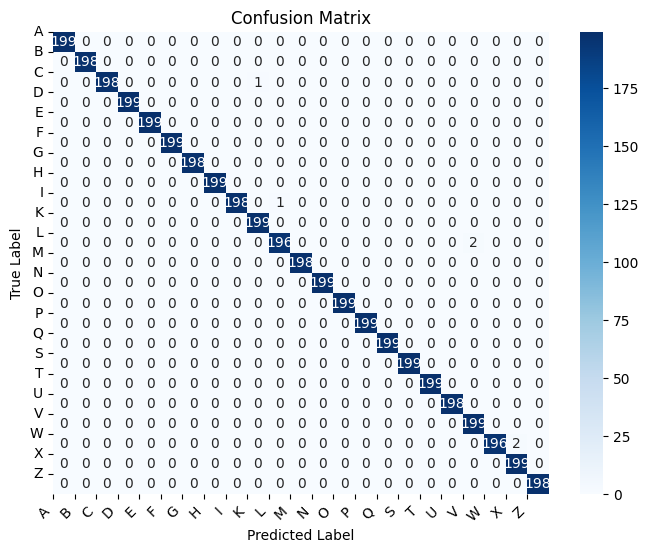

In [24]:
# Calculate confusion matrix and display as heatmap
cm = confusion_matrix(y_true, y_pred_classes)

# Create heatmap with title, x-label, y-label
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='g', cbar=True)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.xticks(ticks=range(len(classes)), labels=classes, rotation=45, ha='right') # rotate x-label ticks
plt.ylabel('True Label')
plt.yticks(ticks=range(len(classes)), labels=classes, rotation=0, ha='right')
plt.show()

In [25]:
# Generate confusion matrix
y_true = y_true.astype(np.int32)  # Convert y_true to int32 if needed
cm = confusion_matrix(y_true, y_pred_classes)
n_classes = cm.shape[0]
tp = np.diag(cm)
fp = np.sum(cm, axis=0) - tp
fn = np.sum(cm, axis=1) - tp
tn = np.sum(cm) - tp - fp - fn

for i in range(n_classes):
    print(f'Class {i}: True Positives: {tp[i]}, True Negatives: {tn[i]}, False Positives: {fp[i]}, False Negatives: {fn[i]}')

Class 0: True Positives: 199, True Negatives: 4371, False Positives: 0, False Negatives: 0
Class 1: True Positives: 198, True Negatives: 4372, False Positives: 0, False Negatives: 0
Class 2: True Positives: 198, True Negatives: 4371, False Positives: 0, False Negatives: 1
Class 3: True Positives: 199, True Negatives: 4371, False Positives: 0, False Negatives: 0
Class 4: True Positives: 199, True Negatives: 4371, False Positives: 0, False Negatives: 0
Class 5: True Positives: 199, True Negatives: 4371, False Positives: 0, False Negatives: 0
Class 6: True Positives: 198, True Negatives: 4372, False Positives: 0, False Negatives: 0
Class 7: True Positives: 199, True Negatives: 4371, False Positives: 0, False Negatives: 0
Class 8: True Positives: 198, True Negatives: 4371, False Positives: 0, False Negatives: 1
Class 9: True Positives: 199, True Negatives: 4370, False Positives: 1, False Negatives: 0
Class 10: True Positives: 196, True Negatives: 4371, False Positives: 1, False Negatives: 

In [26]:
cnn_final.save('CNN.h5')

In [45]:
# Print the first twenty classes in y_true_class_names and y_pred_class_names
print("First five classes in y_true and y_pred_classes:")
for i in range(20):
    print((y_true_class_names[i], y_pred_class_names[i]))

First five classes in y_true and y_pred_classes:
('U', 'U')
('E', 'E')
('A', 'A')
('M', 'M')
('N', 'N')
('S', 'S')
('H', 'H')
('W', 'W')
('E', 'E')
('G', 'G')
('G', 'G')
('A', 'A')
('M', 'M')
('E', 'E')
('P', 'P')
('C', 'C')
('I', 'I')
('K', 'K')
('G', 'G')
('K', 'K')
